#**1. Introduction**

**Business Problem:**

The project aims to develop an image recognition model that can identify the denomination of currency notes based on their visual features. The model should be able to recognize all banknote denominations in different currency types in real-world situations despite environmental factors such as image quality, lighting conditions, and camera angle. We have trained our models to identify the six denominations of Indian Currency (Rs 10, Rs 20, Rs 50, Rs 100, Rs 200, Rs 500, and Rs 2000). We trained two types of models: Decision Trees and Convolutional Neural Networks. Our approach involved training three Decision Trees, each employing distinct feature engineering techniques. Additionally, we explored two CNNs - one built from scratch, and the other leveraging a pre-trained model. We further discuss the performance of these models and business insights in the conclusion.

**Motivation:**

The project has significant practical applications in various fields such as finance, banking, and retail, where the model's ability to accurately recognize different types of currencies will make transactions faster and more reliable. Moreover, the model will be particularly helpful in aiding visually impaired or elderly individuals who may have trouble recognizing different types of currency. By providing a tool that will make the world more accessible to the aging population, the model can directly combat this challenge identified by the World Health Organization. Additionally, the model can help reduce processing costs by 80% in the financial services sector and reduce risks by accurately identifying banknotes compared to tellers.

This problem provided us with a unique opportunity to study and implement a range of machine-learning methods and models. We explored Convolution Neural Networks and Decision Trees to identify the best approach for our solutions. We also employed various data exploration and model testing techniques to improve the accuracy of our model. We have developed a deep understanding of Image Recognition, Supervised Learning methods, and machine learning as a whole.


**Dataset:**

Our dataset can be accessed [here](https://drive.google.com/drive/folders/1ym0IuOB8n8NI2d2h9F0CyjVw5qoj9jFE?usp=sharing) 

It consists of 2571 images of six different currency denominations. The images are split into six files representing each denomiation.

The dataset used in our proposal differs from the dataset used to train models due to challenges encountered in extracting image data from embeddings - we achieved better results using raw images. Nonetheless, the scope and nature of the images remain unchanged, ensuring that there is no deviation from the project's objectives.


# **2. Imports and Loading Dataset**

## 2.1 Importing necessary libraries


In [ ]:
import pandas as pd 
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder

# use color codes in the plots geenrated by seaborn
sns.set(color_codes=True)

In [ ]:
import tensorflow as tf
import os
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import Lasso
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree

In [ ]:
import cv2
import imghdr
from matplotlib import pyplot as plt

In [ ]:
import torch 
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as trans

## 2.2 Connection to google drive and limiting GPU usage


In [ ]:
# Imports the "drive" module from the "google.colab" library and mounts the Google Drive file system to "/content/drive" directory in the Colab environment.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Get the name of the GPU device
device_name = tf.test.gpu_device_name()
# Check if GPU device is available, otherwise raise an error
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
# Limiting GPU Memory Consuption Growth

# Get a list of all available physical GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')

# Get a list of all available physical GPUs
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

## 2.3 Data Loading

In [ ]:
# Unzips currency_dataset file from Google Drive
## **Only run if it's the first time using the project
!unzip /content/drive/MyDrive/DatasetCurrency/currency_dataset.zip -d /content/drive/MyDrive/DatasetCurrency

Archive:  /content/drive/MyDrive/DatasetCurrency/currency_dataset.zip
   creating: /content/drive/MyDrive/DatasetCurrency/dataset/
   creating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/1.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/10.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/100.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/101.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/102.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/103.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/104.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/105.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/106.jpg  
  inflating: /content/drive/MyDrive/DatasetCurrency/dataset/fifty/107.jpg  
  inflating: /content/drive/MyDrive/DatasetCu

In [ ]:
# set the directory path of the dataset
data_dir = '/content/drive/MyDrive/DatasetCurrency/dataset'

# list all files in the directory path
os.listdir(data_dir)


['fifty', 'fivehundred', 'hundred', 'ten', 'thousand', 'twenty']

## 2.4 Data Cleaning

In [ ]:
# join directory path with image file path
image_path = os.path.join('/content/drive/MyDrive/DatasetCurrency/dataset', 'fifty', '1.jpg')
# read image using cv2.imread function
cv2.imread(image_path)

array([[[ 22,  41,  44],
        [ 27,  44,  47],
        [ 32,  47,  49],
        ...,
        [106,  84,  79],
        [105,  83,  78],
        [106,  81,  77]],

       [[ 25,  42,  45],
        [ 29,  44,  47],
        [ 33,  46,  48],
        ...,
        [106,  84,  79],
        [105,  83,  78],
        [107,  82,  78]],

       [[ 29,  43,  49],
        [ 32,  44,  50],
        [ 34,  46,  48],
        ...,
        [107,  85,  80],
        [106,  84,  79],
        [108,  83,  79]],

       ...,

       [[  3,  30,  26],
        [  3,  30,  26],
        [  1,  31,  26],
        ...,
        [ 25,  74,  58],
        [ 24,  73,  57],
        [ 25,  72,  56]],

       [[  3,  28,  24],
        [  3,  28,  24],
        [  0,  29,  24],
        ...,
        [ 21,  73,  56],
        [ 22,  71,  55],
        [ 21,  70,  54]],

       [[  5,  26,  23],
        [  4,  27,  23],
        [  2,  27,  23],
        ...,
        [ 18,  70,  53],
        [ 17,  69,  52],
        [ 19,  68,  52]]

Explaination: The code block below loops through all image files in a dataset directory and removes any image files with file types not in the accepted list of extensions or unreadable. 
It uses OpenCV to see if the image is readable and the built-in module imghdr to read and determine the file type of each image file.

In [ ]:
# list of acceptable image file extensions
image_exts = ['jpg', 'jpeg']

# loop over each image class directory in the dataset directory
for image_class in os.listdir(data_dir): 
    # loop over each image file in the current image class directory
    for image in os.listdir(os.path.join(data_dir, image_class)):
        # construct the full path to the image file
        image_path = os.path.join(data_dir, image_class, image)
        try: 
            # read the image file using OpenCV
            img = cv2.imread(image_path)
            # determine the file type of the image
            tip = imghdr.what(image_path)
            # check if the file type of the image is in the accepted list of extensions
            if tip not in image_exts: 
                print('Image not in ext list {}'.format(image_path))
                # remove the image file if its extension is not in the accepted list
                os.remove(image_path)
        except Exception as e: 
            # print an error message if there is an issue reading or removing the image file
            print('Issue with image {}'.format(image_path))
            os.remove(image_path)


## 2.5 Data Visualization

In [ ]:
# returns the shape of the image array, which includes the height, width, and number of color channels.
img.shape

(1600, 1200, 3)

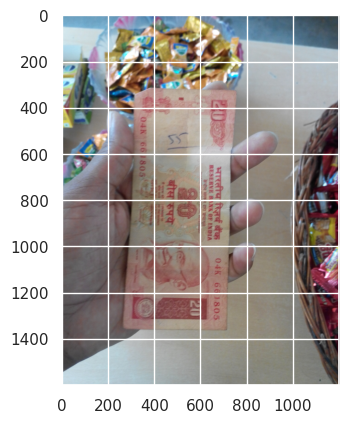

In [ ]:
#This code block displays an image in RGB forma
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
#Create a TF dataset object from the images
data = tf.keras.utils.image_dataset_from_directory(data_dir)

Found 2571 files belonging to 6 classes.


Explaination: The code block below is used to display a sample of images and their corresponding class labels from the given dataset. 

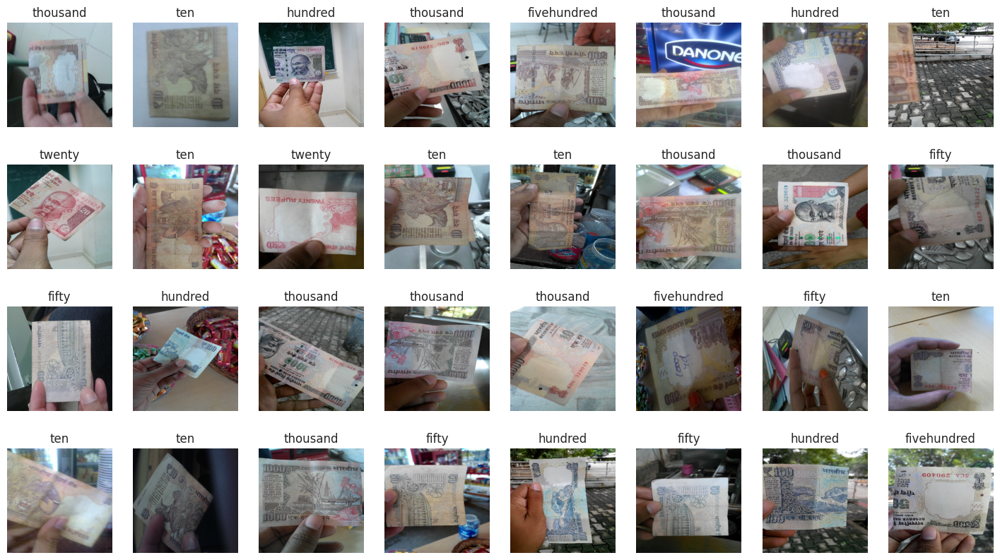

In [ ]:
class_names = data.class_names
 
plt.figure(figsize=(18,10))
 
# Assumes dataset batch_size is at least 32.
num_rows = 4
num_cols = 8
 
# Here we use the take() method to retrieve just the first batch of data from the training portion of the dataset.
for image_batch, labels_batch in data.take(1): 
      
    # Plot each of the images in the batch and the associated ground truth labels.
    for i in range(num_rows*num_cols):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        truth_idx = labels_batch[i].numpy()
        plt.title(class_names[truth_idx])
        plt.axis("off")

# **3. Building Decision Tree Models**

## 3.1 Preparing and Preprocessing Data

In [ ]:
# Define constants for Decision Tree
data_dir = '/content/drive/MyDrive/DatasetCurrency/dataset'
img_size = (224, 224)
batch_size = 64
k = 900

In [ ]:
# Load data from directory using keras preprocessing image dataset 
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,  # 20% of the data will be used for validation
    subset="training",    # subset of data to use for training
    seed=123,            
    image_size=img_size, 
    batch_size=batch_size
)

# Same as above, but using a different subset of the data for validation
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation", 
    seed=123,
    image_size=img_size,
    batch_size=batch_size,
)

Found 2571 files belonging to 6 classes.
Using 2057 files for training.
Found 2571 files belonging to 6 classes.
Using 514 files for validation.


In [ ]:
# Get the cardinality (total number of elements) of validation dataset
val_batches = tf.data.experimental.cardinality(val_ds)

# Take 1/5th of the validation data as test dataset and remove them from validation dataset ensuring testing data is unseen
test_ds = val_ds.take(val_batches // 5)
val_ds = val_ds.skip(val_batches // 5)

In [ ]:
# Extract image data and labels from training dataset
train_images = []
train_labels = []
for images, labels in train_ds:
    train_images.append(images.numpy())
    train_labels.append(labels.numpy())
train_images = np.concatenate(train_images)
train_labels = np.concatenate(train_labels)

# Extract image data and labels from validation dataset
val_images = []
val_labels = []
for images, labels in val_ds:
    val_images.append(images.numpy())
    val_labels.append(labels.numpy())
val_images = np.concatenate(val_images)
val_labels = np.concatenate(val_labels)

# Extract image data and labels from test dataset
test_images = []
test_labels = []
for images, labels in test_ds:
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())
test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

In [ ]:
# Preprocess the image data
# Dividing by 255 scales the pixel values to be between 0 and 1
train_images = train_images / 255.0
val_images = val_images / 255.0
test_images = test_images / 255.0

## 3.2 one-hot encoding the labels

In [ ]:
# Convert labels to one-hot encoding
enc = OneHotEncoder()
train_labels = enc.fit_transform(train_labels.reshape(-1, 1)).toarray()
val_labels = enc.transform(val_labels.reshape(-1, 1)).toarray()
test_labels = enc.transform(test_labels.reshape(-1, 1)).toarray()

## 3.3 Feature Engineering


In [ ]:
# Flatten the image data
train_images = np.reshape(train_images, (train_images.shape[0], -1))
val_images = np.reshape(val_images, (val_images.shape[0], -1))
test_images = np.reshape(test_images, (test_images.shape[0], -1))

In [ ]:
# Select top 900 features using SelectKBest
selector = SelectKBest(chi2, k=k) # k=900 was determined to give best results after testing
selector.fit(train_images, train_labels)
train_images_kbest = selector.transform(train_images)
val_images_kbest = selector.transform(val_images)
test_images_kbest = selector.transform(test_images)

In [ ]:
# Apply Lasso regularization
alpha = 0.001 # alpha was determined after testing to optimize best results
lasso = Lasso(alpha=alpha)
train_images_lasso = lasso.fit(train_images, train_labels).predict(train_images)
val_images_lasso = lasso.predict(val_images)
test_images_lasso = lasso.predict(test_images)


In [ ]:
# Apply PCA
k = 500  # define the value of km determined after testing to optimize best results
pca = PCA(n_components=k)
pca.fit(train_images)
train_images_pca = pca.transform(train_images)
val_images_pca = pca.transform(val_images)
test_images_pca = pca.transform(test_images)

## 3.3 Train and test tree with different inputs

In [ ]:
# Train the decision tree with SelectKBest
dt_kbest = DecisionTreeClassifier()
dt_kbest.fit(train_images_kbest, train_labels)

# Compute train, validation, and test accuracy
train_acc_kbest = dt_kbest.score(train_images_kbest, train_labels)
val_acc_kbest = dt_kbest.score(val_images_kbest, val_labels)
test_acc_kbest = dt_kbest.score(test_images_kbest, test_labels)

# Print accuracy
print("SelectKBest")
print("Train accuracy: {:.2f}%".format(train_acc_kbest * 100))
print("Validation accuracy: {:.2f}%".format(val_acc_kbest * 100))
print("Test accuracy: {:.2f}%".format(test_acc_kbest * 100))

SelectKBest
Train accuracy: 100.00%
Validation accuracy: 23.56%
Test accuracy: 18.75%


In [ ]:
# Train the decision tree with PCA
dt_pca = DecisionTreeClassifier()
dt_pca.fit(train_images_pca, train_labels)

# Compute train, validation, and test accuracy
train_preds_pca = dt_pca.predict(train_images_pca)
val_preds_pca = dt_pca.predict(val_images_pca)
test_preds_pca = dt_pca.predict(test_images_pca)

train_acc_pca = accuracy_score(train_labels, train_preds_pca)
val_acc_pca = accuracy_score(val_labels, val_preds_pca)
test_acc_pca = accuracy_score(test_labels, test_preds_pca)

# Print accuracy
print("PCA")
print("Train accuracy: {:.2f}%".format(train_acc_pca * 100))
print("Validation accuracy: {:.2f}%".format(val_acc_pca * 100))
print("Test accuracy: {:.2f}%".format(test_acc_pca * 100))

PCA
Train accuracy: 100.00%
Validation accuracy: 27.56%
Test accuracy: 28.12%


In [ ]:
# Train the decision tree with Lasso regularization
dt_lasso = DecisionTreeClassifier()
dt_lasso.fit(train_images_lasso, train_labels)

# Compute train, validation, and test accuracy
train_acc_lasso = dt_lasso.score(train_images_lasso, train_labels)
val_acc_lasso = dt_lasso.score(val_images_lasso, val_labels)
test_acc_lasso = dt_lasso.score(test_images_lasso, test_labels)

# Print accuracy
print("Lasso")
print("Train accuracy: {:.2f}%".format(train_acc_lasso * 100))
print("Validation accuracy: {:.2f}%".format(val_acc_lasso * 100))
print("Test accuracy: {:.2f}%".format(test_acc_lasso * 100))

Lasso
Train accuracy: 100.00%
Validation accuracy: 38.44%
Test accuracy: 29.69%


[Text(0.861792703276699, 0.9666666666666667, 'x[5] <= 0.349\ngini = 0.278\nsamples = 2057\nvalue = [[1706, 351]\n[1732, 325]\n[1728, 329]\n[1711, 346]\n[1706, 351]\n[1702, 355]]'),
 Text(0.7672747269417476, 0.9, 'x[4] <= 0.328\ngini = 0.268\nsamples = 1714\nvalue = [[1363, 351]\n[1389, 325]\n[1385, 329]\n[1376, 338]\n[1365, 349]\n[1692, 22]]'),
 Text(0.6680445995145631, 0.8333333333333334, 'x[1] <= 0.348\ngini = 0.254\nsamples = 1364\nvalue = [[1016, 348]\n[1040, 324]\n[1039, 325]\n[1031, 333]\n[1352, 12]\n[1342, 22]]'),
 Text(0.578807645631068, 0.7666666666666667, 'x[0] <= 0.353\ngini = 0.232\nsamples = 1050\nvalue = [[703, 347]\n[1035, 15]\n[726, 324]\n[720, 330]\n[1038, 12]\n[1028, 22]]'),
 Text(0.47800364077669905, 0.7, 'x[2] <= 0.339\ngini = 0.198\nsamples = 718\nvalue = [[694, 24]\n[703, 15]\n[402, 316]\n[389, 329]\n[706, 12]\n[696, 22]]'),
 Text(0.33464805825242716, 0.6333333333333333, 'x[3] <= 0.252\ngini = 0.113\nsamples = 395\nvalue = [[373, 22]\n[380, 15]\n[387, 8]\n[76, 319

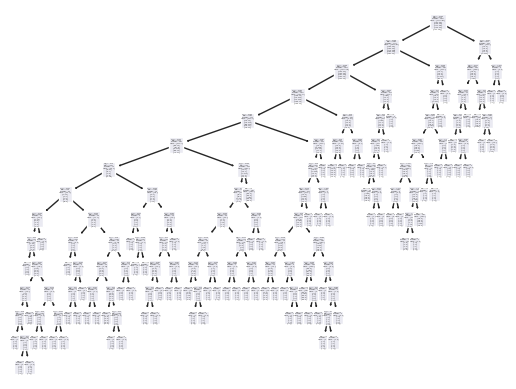

In [ ]:
# Plot Lasso decision tree for visualization
tree.plot_tree(dt_lasso)

# **4. Building a CNN Model**

## 4.1 Preparing Data (splitting into Train, Val, Test)

In [ ]:
import random
SEED_VALUE = 41
 
# Fix seed to make training deterministic for reproducibility purposes
random.seed(SEED_VALUE)
np.random.seed(SEED_VALUE)
tf.random.set_seed(SEED_VALUE)

In [ ]:
# Load training data from directory with a validation split of 0.2, using integer labels and a batch size of 32
train_data = tf.keras.utils.image_dataset_from_directory(
    directory=data_dir,
    shuffle=True,
    validation_split=0.2,
    seed=SEED_VALUE,
    subset="training",
    batch_size=32,
    label_mode='int', # Use integer encoding
    image_size=(224, 224),
)

# Load validation data from directory with a validation split of 0.2, using integer labels and a batch size of 32
val_data = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=SEED_VALUE,
    image_size=(224, 224),
    batch_size=32
)

Found 2571 files belonging to 6 classes.
Using 2057 files for training.
Found 2571 files belonging to 6 classes.
Using 514 files for validation.


In [ ]:
# Calculate the number of batches in the validation dataset
val_batches = tf.data.experimental.cardinality(val_data)

# Take 2/3 of the validation data for testing ensuring testing data is not seen by model
test_data = val_data.take((2*val_batches) // 3)

# Skip the first 2/3 of the validation data for training 
val_ds = val_data.skip((2*val_batches) // 3)

## 4.2 Visualizing and Understanding Training Data

In [ ]:
# Outputting dataset classes
class_names = train_data.class_names
print(class_names)

['fifty', 'fivehundred', 'hundred', 'ten', 'thousand', 'twenty']


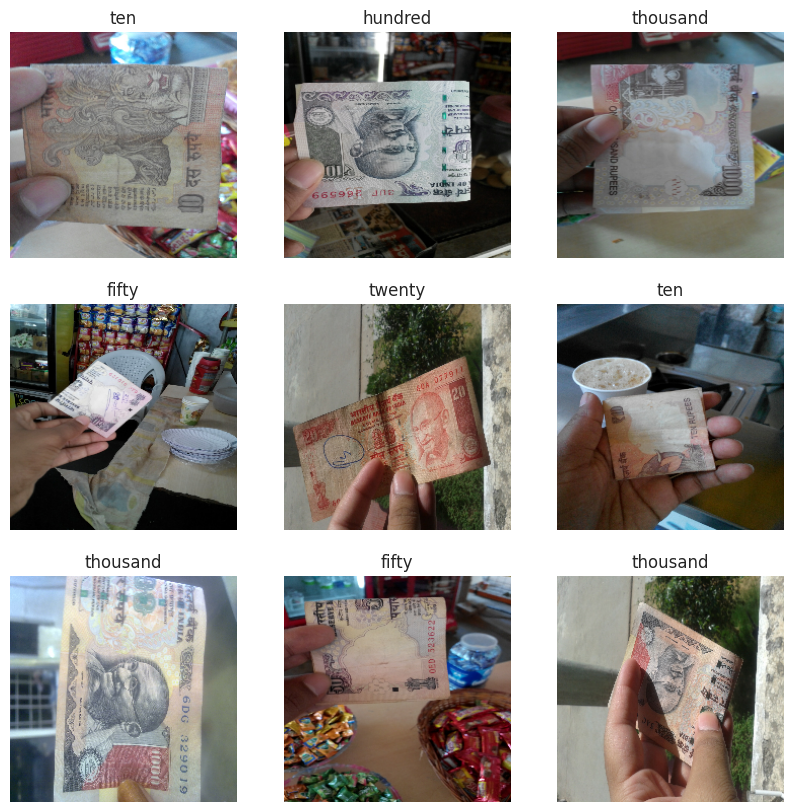

In [ ]:
# Set figure size for plotting
plt.figure(figsize=(10, 10))

# Get the first batch of images and labels from the train dataset
for images, labels in train_data.take(1):
  
  # Plot the first 9 images and their labels
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    label = class_names[labels[i]]
    plt.title(label)
    plt.axis("off")

In [ ]:
# Print the shape of the image batch
for image_batch, labels_batch in train_data:
  print(image_batch.shape)
  print(labels_batch.shape)
  break


(32, 224, 224, 3)
(32,)


## 4.3 Normalizing Dataset


In [ ]:
# Define a normalization layer
normalization_layer = tf.keras.layers.Rescaling(1./255)


In [ ]:
normalized_ds = train_data.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


## 4.4 Building and Training Model

---



> 



In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

# Cache and prefetch the training data
train_ds = train_data.cache().prefetch(buffer_size=AUTOTUNE)

# Cache and prefetch the validation data
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
num_classes = 6  # Define the number of classes

# Define a sequential model
model1 = tf.keras.Sequential([
  tf.keras.layers.Rescaling(1./255),  # Rescale input pixel values to [0,1]
  tf.keras.layers.Conv2D(64, 3, activation='relu'),  # 2D convolutional layer with 64 filters and 3x3 kernel size
  tf.keras.layers.MaxPooling2D(),  # Max pooling layer with 2x2 pool size
  tf.keras.layers.Conv2D(32, 3, activation='relu'),  # 2D convolutional layer with 32 filters and 3x3 kernel size
  tf.keras.layers.MaxPooling2D(),  # Max pooling layer with 2x2 pool size
  tf.keras.layers.Conv2D(32, 3, activation='relu'),  # 2D convolutional layer with 32 filters and 3x3 kernel size
  tf.keras.layers.MaxPooling2D(),  # Max pooling layer with 2x2 pool size
  tf.keras.layers.Flatten(),  # Flatten the input to a 1D vector
  tf.keras.layers.Dense(128, activation='relu'),  # Dense layer with 128 units 
  tf.keras.layers.Dense(num_classes)  # Dense layer with num_classes units
])


In [ ]:
#Compiling the model with an optimizer, loss function, and metrics to be tracked during training
model1.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [ ]:
# Define the input shape of the model
model1.build((224, 224, 3))

# Print a summary of the model architecture
model1.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (224, 224, 3)             0         
                                                                 
 conv2d_9 (Conv2D)           multiple                  1792      
                                                                 
 max_pooling2d_9 (MaxPooling  multiple                 0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          multiple                  18464     
                                                                 
 max_pooling2d_10 (MaxPoolin  multiple                 0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          multiple                 

In [ ]:
# Train the model and validate using val_ds for 20 epochs
hist = model1.fit(
  train_ds,
  validation_data=val_ds,
  epochs=20
)


Epoch 1/20
65/65 [==============================] - 6s 56ms/step - loss: 1.8121 - accuracy: 0.1979 - val_loss: 1.7735 - val_accuracy: 0.1605
Epoch 2/20
65/65 [==============================] - 3s 53ms/step - loss: 1.5872 - accuracy: 0.3384 - val_loss: 1.3955 - val_accuracy: 0.4691
Epoch 3/20
65/65 [==============================] - 4s 54ms/step - loss: 1.2554 - accuracy: 0.5124 - val_loss: 1.2222 - val_accuracy: 0.5309
Epoch 4/20
65/65 [==============================] - 3s 53ms/step - loss: 1.0181 - accuracy: 0.5955 - val_loss: 1.1996 - val_accuracy: 0.5741
Epoch 5/20
65/65 [==============================] - 3s 53ms/step - loss: 0.8051 - accuracy: 0.6962 - val_loss: 1.2440 - val_accuracy: 0.5494
Epoch 6/20
65/65 [==============================] - 4s 55ms/step - loss: 0.6535 - accuracy: 0.7632 - val_loss: 1.2690 - val_accuracy: 0.5123
Epoch 7/20
65/65 [==============================] - 3s 54ms/step - loss: 0.4483 - accuracy: 0.8352 - val_loss: 1.4800 - val_accuracy: 0.6173
Epoch 8/20
65

## 4.5 Graphing Model Accuracy and Loss Change




In [ ]:
# Plotting metrics over epochs for model training or evaluation
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter)
def plot_results(metrics, ylabel=None, ylim=None, metric_name=None, color=None):
     
    fig, ax = plt.subplots(figsize=(15, 4))
 
    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics,]
        metric_name = [metric_name,]
         
    for idx, metric in enumerate(metrics):    
        ax.plot(metric, color=color[idx])
     
    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(ylabel)
    plt.xlim([0, 7])
    plt.ylim(ylim)
    # Tailor x-axis tick marks
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)   
    plt.show()
    plt.close()

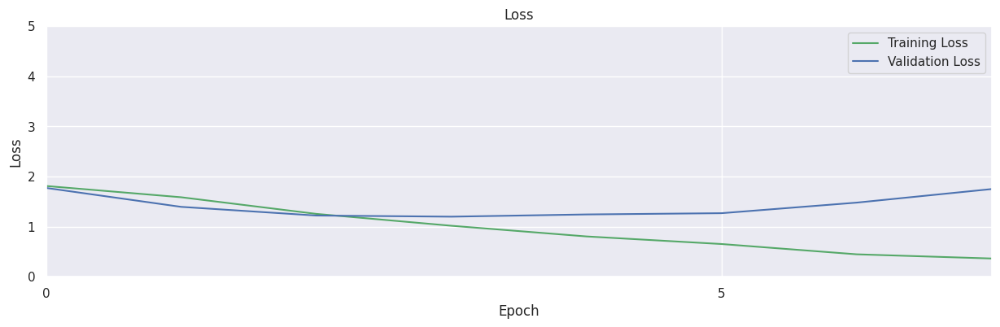

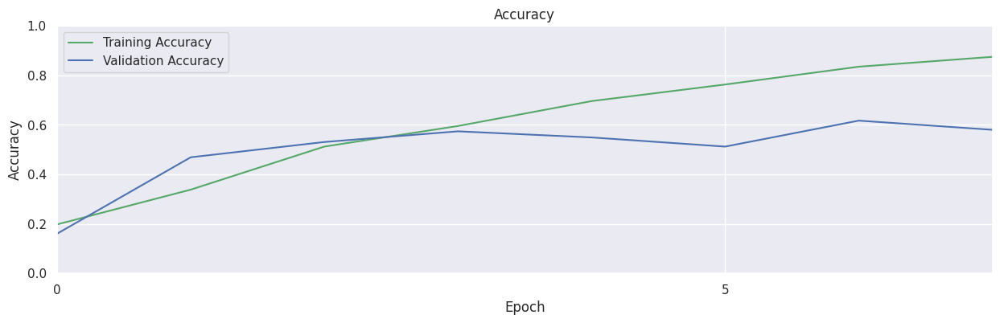

In [ ]:
# Retrieve training results.
train_loss = hist.history["loss"]
train_acc  = hist.history["accuracy"]
valid_loss = hist.history["val_loss"]
valid_acc  = hist.history["val_accuracy"]
     
plot_results([ train_loss, valid_loss ],        
            ylabel="Loss", 
            ylim = [0.0, 5.0],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);
 
plot_results([ train_acc, valid_acc ], 
            ylabel="Accuracy",
            ylim = [0.0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])



## 4.6 Testing Model Accuracy

In [ ]:
# Model accuracy on validation data
print(f"Model valid accuracy: {model1.evaluate(val_data)[1]*100.:.3f}")

17/17 [==============================] - 6s 216ms/step - loss: 2.8810 - accuracy: 0.6070
Model valid accuracy: 60.700


In [ ]:
# Model accuracy on test data. Test data has never been seen by model
print(f"Model test accuracy: {model1.evaluate(test_data)[1]*100.:.3f}")

11/11 [==============================] - 5s 246ms/step - loss: 2.8848 - accuracy: 0.6051
Model test accuracy: 60.511


## 4.7 Visualzing Model Performance


*   Confusion Matrix
*   Outputting Predicted Labels vs Actual Labels


In [ ]:
def display_predictions(dataset, model, class_names):
     
    plt.figure(figsize=(20,20))
    num_rows = 8
    num_cols = 8
    jdx = 0
     
    # Evaluate all the batches.
    for image_batch, labels_batch in dataset.take(2):
         
        print(image_batch.shape)
         
        # Predictions for the current batch.
        predictions = model.predict(image_batch)
         
        # Loop over all the images in the current batch.
        for idx in range(len(labels_batch)):
             
            pred_idx = tf.argmax(predictions[idx]).numpy()
            truth_idx = labels_batch[idx].numpy()
             
            # Set the title color based on the prediction.
            if pred_idx == truth_idx:
                color='g'
            else:
                color='r'
                 
            jdx += 1
                 
            if jdx > num_rows*num_cols:
                # Break from the loops if the maximum number of images have been plotted
                break
                 
            ax = plt.subplot(num_rows, num_cols, jdx)
            title = str(class_names[truth_idx]) + " : " + str(class_names[pred_idx])
                 
            title_obj = plt.title(title)
            plt.setp(title_obj, color=color)
            plt.axis("off")
            plt.imshow(image_batch[idx].numpy().astype("uint8"));
    return

In [ ]:
import sklearn.metrics as metrics
def confusion_matrix(dataset, model, class_names):
     

    pred_idx = []
    truth_idx = []
    # Evaluate all the batches.
    for image_batch, labels_batch in dataset.take(2):
         
        print(image_batch.shape)
         
        # Predictions for the current batch.
        predictions = model.predict(image_batch)
         
        # Loop over all the images in the current batch.
        for idx in range(len(labels_batch)):
             
            pred_idx.append(tf.argmax(predictions[idx]).numpy())
            truth_idx.append(labels_batch[idx].numpy())
             
        report = metrics.confusion_matrix(truth_idx, pred_idx)
        print(report)   
    return report

In [ ]:
cm = confusion_matrix(test_data, model1, class_names)

(32, 224, 224, 3)
1/1 [==============================] - 0s 133ms/step
[[5 1 0 1 0 0]
 [0 5 0 2 0 0]
 [0 0 1 0 0 0]
 [0 0 1 3 0 2]
 [0 0 0 0 6 2]
 [0 0 1 0 0 2]]
(32, 224, 224, 3)
1/1 [==============================] - 0s 38ms/step
[[5 3 0 1 1 0]
 [2 7 0 3 0 0]
 [2 0 7 0 0 0]
 [0 0 1 9 2 3]
 [0 0 0 0 7 2]
 [0 0 1 0 1 7]]


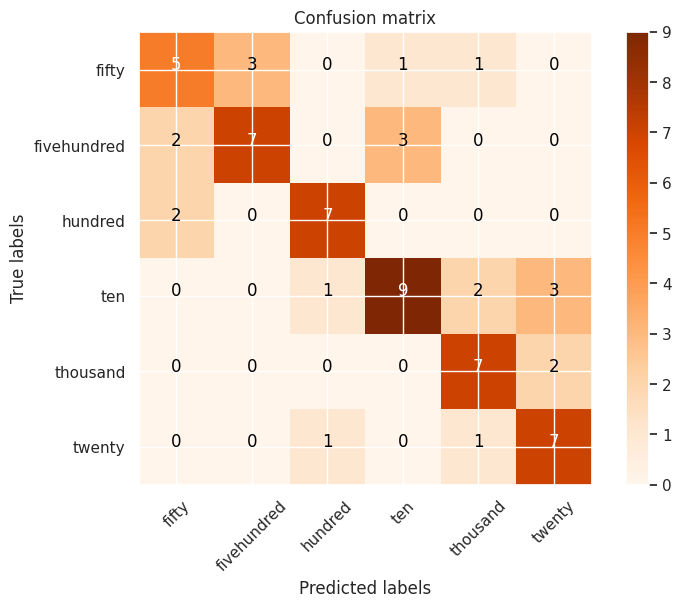

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import itertools

def plot_confusion_matrix(cm, target_names, title='Confusion matrix', cmap=None, normalize=False):
    """
    arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions
    """
     
    if cmap is None:
        cmap = plt.get_cmap('Oranges')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    
    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylim(len(target_names)-0.5, -0.5)
    plt.ylabel('True labels')
    plt.xlabel('Predicted labels')
    plt.savefig(title + '.png', dpi=500, bbox_inches = 'tight')
    plt.show()
    
    
    
# # a tuple for all the class names
# target_names = ('T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
#                  'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot')
plot_confusion_matrix(cm, class_names)

(32, 224, 224, 3)
1/1 [==============================] - 0s 213ms/step
(32, 224, 224, 3)
1/1 [==============================] - 0s 43ms/step


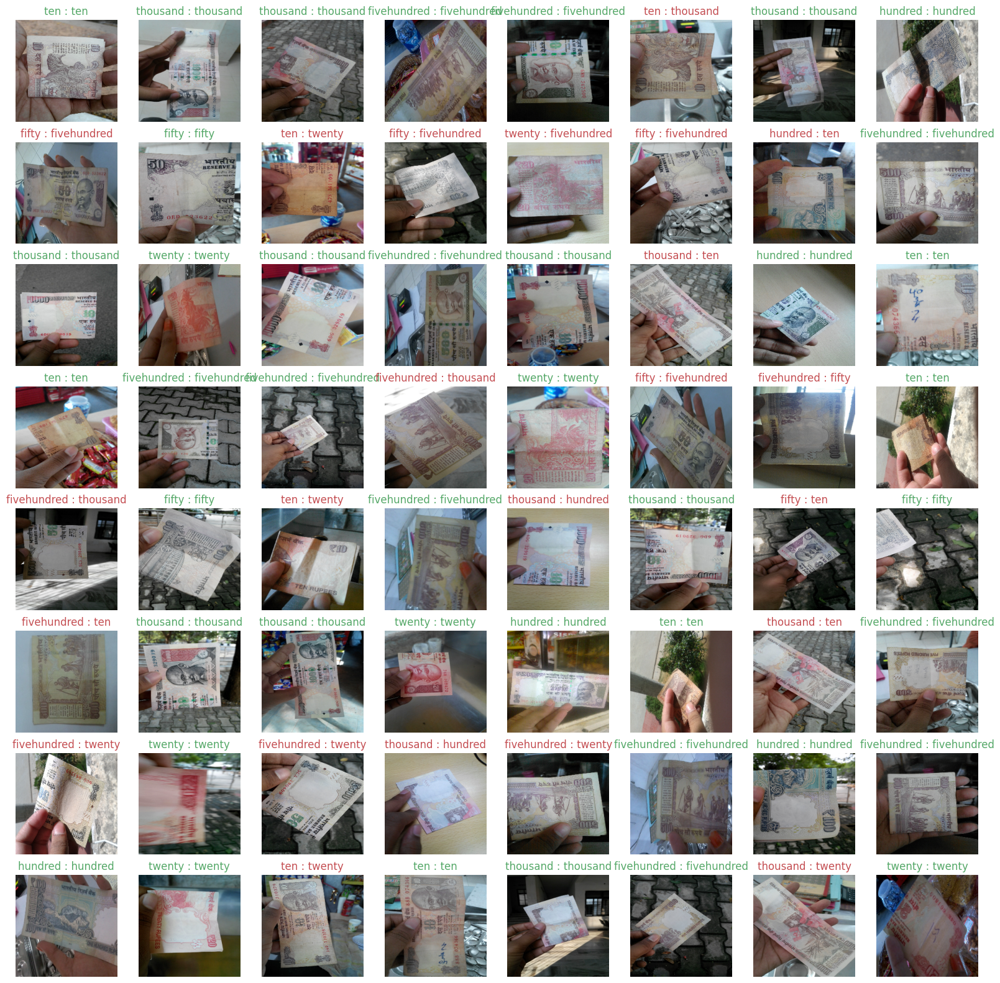

In [ ]:
# Displaying Predicted vs Actual Labels
display_predictions(test_data, model1, class_names)

# **5. Using a Pre-Trained Model VGG16**

## 5.1 Importing Pre-Trained Layers and Adapting Them to Our Data and Classifications

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras import layers

Using the most popular pretrained cnn model for image classification VGG16

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16

base_model = VGG16(input_shape = (224, 224, 3), # Shape of our images
include_top = False, # Leave out the last fully connected layer
weights = 'imagenet')

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
# Flatten the output layer to 1 dimension
x = layers.Flatten()(base_model.output)

# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(512, activation='relu')(x)

# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)

# Add a final sigmoid layer with 6 node for classification output
x = layers.Dense(6, activation='sigmoid')(x)

model2 = tf.keras.models.Model(base_model.input, x)

model2.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001), loss=tf.keras.losses.SparseCategoricalCrossentropy(),metrics = ['accuracy'])

In [ ]:
model2.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

## 5.2 Refining the Model with our Training Data

In [ ]:
# Training the model with the training and validation datasets
vgghist = model2.fit(train_ds, validation_data = val_ds, epochs = 10)

Epoch 1/10
65/65 [==============================] - 19s 200ms/step - loss: 10.8275 - accuracy: 0.3602 - val_loss: 2.4150 - val_accuracy: 0.6111
Epoch 2/10
65/65 [==============================] - 10s 152ms/step - loss: 1.8474 - accuracy: 0.7263 - val_loss: 2.4815 - val_accuracy: 0.5988
Epoch 3/10
65/65 [==============================] - 10s 151ms/step - loss: 0.8333 - accuracy: 0.8454 - val_loss: 1.7892 - val_accuracy: 0.7099
Epoch 4/10
65/65 [==============================] - 10s 147ms/step - loss: 0.5489 - accuracy: 0.8969 - val_loss: 1.8235 - val_accuracy: 0.6914
Epoch 5/10
65/65 [==============================] - 9s 145ms/step - loss: 0.3639 - accuracy: 0.9285 - val_loss: 1.5681 - val_accuracy: 0.7407
Epoch 6/10
65/65 [==============================] - 9s 145ms/step - loss: 0.2358 - accuracy: 0.9519 - val_loss: 1.4515 - val_accuracy: 0.7778
Epoch 7/10
65/65 [==============================] - 10s 147ms/step - loss: 0.1676 - accuracy: 0.9631 - val_loss: 1.2624 - val_accuracy: 0.7963


## 5.3 Graphing Model Accuracy and Loss Change


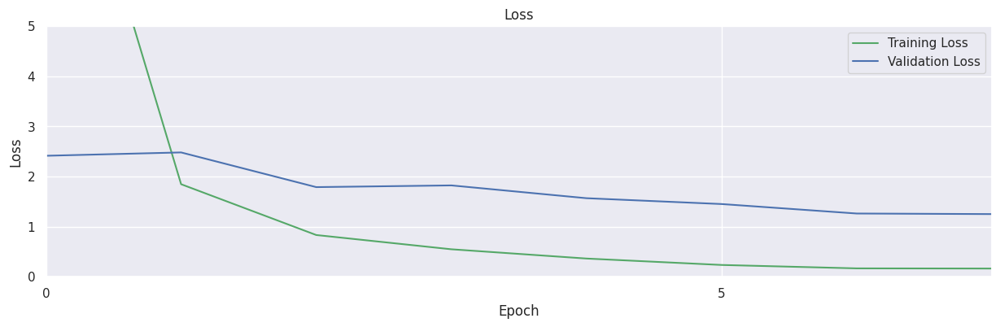

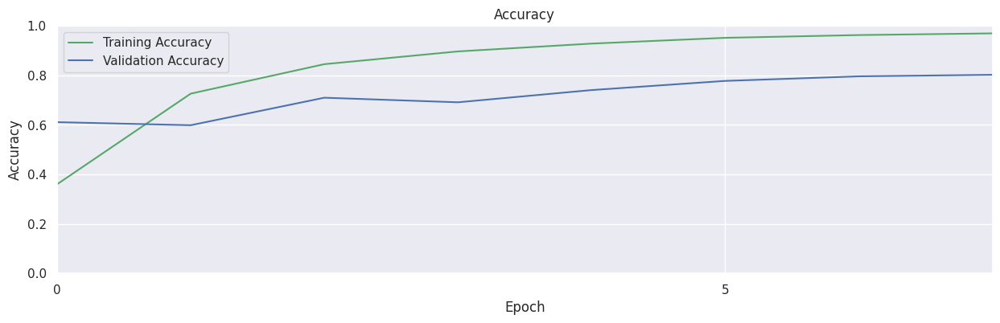

In [ ]:
# Retrieve training results
train_loss = vgghist.history["loss"]
train_acc  = vgghist.history["accuracy"]
valid_loss = vgghist.history["val_loss"]
valid_acc  = vgghist.history["val_accuracy"]
     
plot_results([ train_loss, valid_loss ],        
            ylabel="Loss", 
            ylim = [0.0, 5.0],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);
 
plot_results([ train_acc, valid_acc ], 
            ylabel="Accuracy",
            ylim = [0.0, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])

## 5.4 Testing Model Accuracy on Test Data

In [ ]:
print(f"VGGModel test accuracy: {model2.evaluate(test_data)[1]*100.:.3f}")

11/11 [==============================] - 8s 464ms/step - loss: 1.0884 - accuracy: 0.8239
VGGModel test accuracy: 82.386


## 5.5 Visualzing Model Performance


*   Confusion Matrix
*   Outputting Predicted Labels vs Actual Labels

In [ ]:
cm_vgg = confusion_matrix(test_data, model2, class_names)

(32, 224, 224, 3)
1/1 [==============================] - 1s 1s/step
[[6 0 0 0 0 0]
 [0 5 0 0 1 0]
 [1 2 2 0 0 0]
 [0 0 0 5 0 0]
 [1 0 0 0 6 0]
 [0 0 0 0 0 3]]
(32, 224, 224, 3)
1/1 [==============================] - 0s 52ms/step
[[12  0  1  0  0  0]
 [ 1  7  0  0  3  0]
 [ 1  2  3  0  0  0]
 [ 0  0  0 10  0  0]
 [ 1  0  0  0 14  0]
 [ 0  1  0  1  0  7]]


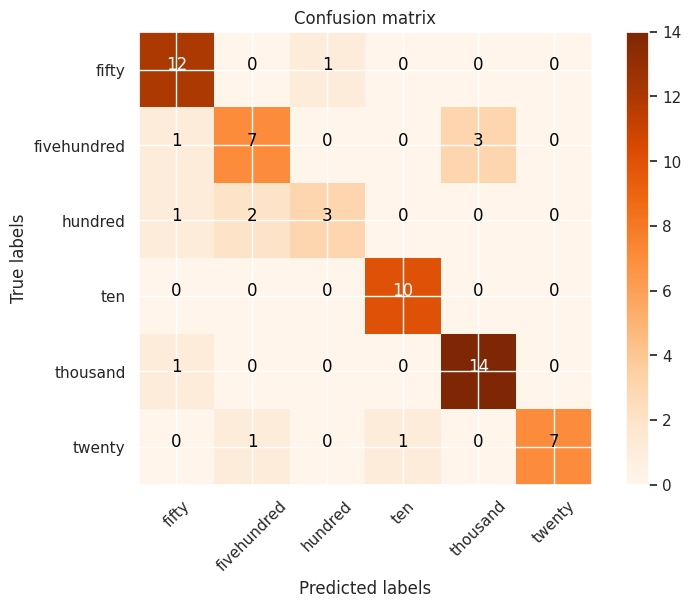

In [ ]:
plot_confusion_matrix(cm_vgg, class_names)

(32, 224, 224, 3)
1/1 [==============================] - 0s 55ms/step
(32, 224, 224, 3)
1/1 [==============================] - 0s 31ms/step


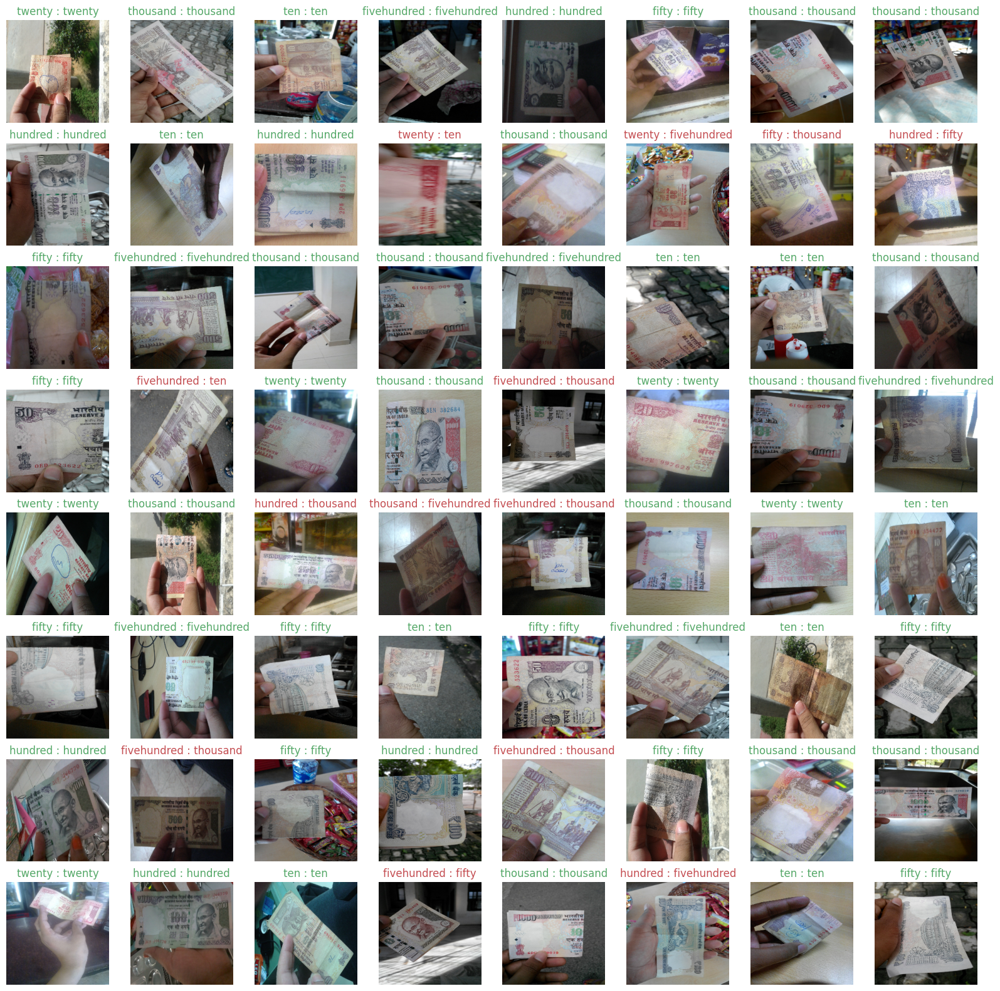

In [ ]:
display_predictions(test_data, model2, class_names)

#**6. Conclusion**

## 6.1 Summary of Findings



**Dataset**

We developed two models to recognize Indian currency notes based on denomination: Decision Trees and Convolutional Neural Networks. Following training, we evaluated both models' classification accuracy on an unseen training dataset.

Before beginning the training process, we analyzed our dataset, which consisted of 2571 images. We carefully examined a selection of images, including their dimensions (height, width, and color channels). Our images varies significanly due to real-world factors such as image quality, lighting conditions, and camera angle. It's worth noting that many of the images depicted only partial views of the currency notes. Our analysis led us to conclude that our models would be challenged when identifying currency in various conditions, resulting in lower classification accuracy than if we had used clear images.

For example, due to variations in lighting, using the currency's color alone may not be as effective as using consistent coloring. Similarly, large differences in the background could cause the models to focus on incorrect patterns. That being said, we were confident in our dataset choice. Tt provided a diverse set of real-world images that would help our models perform well in real-world scenarios which was the goal of this project. We trained both Decision Trees and Convolutional Neural Networks models using the dataset and evaluated their classification accuracy on an unseen training dataset.

**Decision Trees**

Our initial approach involved training decision trees, even though we anticipated that they might not perform as well as CNNs. This is because CNN's  are more adept at complex image classification. Using decision trees would allow us to establish a baseline to compare the performance of our CNN models and establish their superiority.

To optimize our decision tree models, we experimented with three different feature engineering techniques. Prior to training, we divided our dataset into validation, training, and testing sets, with the testing set remaining unseen by the model. We also employed one-hot encoding to represent the labels. Additionally, we flattened the image data into one-dimensional vectors, as this is the format that the models expect for input data.



1.   SelectKBest


We first used the SelectKBest method, which selects the features with the highest score according to a specified value of k. This approach allowed us to narrow down the features used in training the decision trees and potentially improve their accuracy. After trial and error we settled on a K value of 900 is it resulted in the best model. The SelectKBest returned the following accuracy score on our most recent run: 

Train accuracy: 100.00%
Validation accuracy: 23.56%
Test accuracy: 18.75%

While we evaluated the performance of all three accuracy measures, we primarily focused on the test accuracy to assess the model's ability to classify new, unseen data. Despite consistently outperforming the 16% accuracy threshold of random guessing, the model's accuracy remained suboptimal, with scores hovering around the high teens to low twenties. Nevertheless, the SelectKBest decision tree was able to identify some correlation among the features, suggesting some potential for improvement with further refinement.

2.   PCA

PCA (Principal Component Analysis) is a dimensionality reduction technique that transforms the data into a new set of features by projecting it onto a lower-dimensional space. In our experiment, we utilized PCA to reduce the number of features in our model and potentially improve accuracy. After running multiple iterations, we found that a PCA model with the following accuracy scores performed best:

Train accuracy: 100.00%
Validation accuracy: 27.56%
Test accuracy: 28.12%

The accuracy scores of the PCA model improved compared to the SelectKBest model averaging in the high twenties. PCA decision tree was able to identify some correlation among the features and reduced the number of features used for classification. That being said the model is still remained relatively low and sub-optimal.

3.   Lasso

Lasso is a linear regression method that performs regularization by imposing a penalty on the absolute size of the regression coefficients. We applied Lasso regression to select the most significant features and improve the accuracy of our decision trees. After several iterations, we obtained the following accuracy scores:

Train accuracy: 100.00%
Validation accuracy: 38.44%
Test accuracy: 29.69%

Compared to the SelectKBest and PCA models, the Lasso model outperformed the others, achieving the highest validation and test accuracy scores averaging in the low 30s. This suggests that the Lasso decision tree was able to identify more relevant features and reduce overfitting. An interesting observation from the Lasso model is that while it had a high validation accuracy in the high 30s, its test accuracy was considerably lower. In contrast, our other models had similar validation and test accuracies. This discrepancy in the Lasso model's performance may suggest that the model was more sensitive to the specific data in the validation set and over-fitting the model to adjust to those. 



Overall, the Lasso decision tree model outperformed our other models with accuracy scores in the low thirties. Although the accuracy is still relatively low, we were pleased with the results as it demonstrated that even a simplistic model like Decision Trees could identify some patterns in the diverse image dataset. This accuracy score served as a useful baseline for assessing the improvements shown by our CNN models.


## **CNN**

### ***Custom Model***

To develop a highly accurate image recognition model, we began by carefully splitting our data into training, validation, and testing sets. We then applied normalization and rescaling to the images to ensure that pixel values ranged from 0 to 1, which simplified the learning process for our model.

Our CNN model was designed as a Sequential model consisting of three Convolutional layers followed by MaxPooling layers. The model started with a Rescaling layer at the input with no trainable parameters. The Conv2D layers had 1,792, 18,464, and 9,248 trainable parameters respectively, while the MaxPooling2D layers had none. The model concluded with two Dense layers, with 2,769,024 and 774 trainable parameters respectively. In total, our model had 2,799,302 trainable parameters.

We then compiled the model using the Adam optimizer, SparseCategoricalCrossentropy loss function, and accuracy as the evaluation metric. The Adam optimizer updated the model's parameters during training to minimize the loss function. Meanwhile, the SparseCategoricalCrossentropy loss function was utilized for multi-categorical classification, which was the case for our project. It computed the cross-entropy loss between the true class labels and the predicted class probabilities.

Our model was then trained with the training and validation datasets for 20 epochs, achieving a validation accuracy of up to 65%. Finally, we tested the model using the testing dataset. Despite the challenging nature of our dataset, with low-quality and unclear images, our model achieved an impressive accuracy of 60.511%. Overall, our approach resulted in an effective model for image recognition, significantly surpassing the accuracy of our Decision Tree baseline.



### ***Pre-Trained Model***
VGG16 is a powerful convolutional neural network architecture that was designed by the Visual Geometry Group at the University of Oxford, hence the name VGG. The network is widely used for image classification tasks, thanks to its 16 convolutional and fully connected layers. The architecture of VGG16 is characterized by the use of small 3x3 convolutional filters, which enable the network to learn more complex and abstract features. Additionally, the network features five max pooling layers, which help to reduce the spatial dimensions of the feature maps and make the model more computationally efficient.

The main purpose of VGG16 is to classify images into one of a thousand possible categories, based on the presence or absence of certain visual features in the image. This is achieved through a process called training, during which the network learns a set of weights that are optimized to accurately predict the correct category label for a given image.

After training VGG16 on our training dataset with 10 epochs, we were able to achieve an impressive 80% accuracy on our testing dataset. This result is a testament to the power and effectiveness of the VGG16 architecture in image classification tasks.

Though VGG16 outperformed our own model in terms of accuracy we were still satisfied with the performance of our model. We were able to achieve a comparable level of accuracy despite having a smaller architecture and fewer training epochs. Overall, we believe that our approach demonstrates the potential of deep learning models in image recognition tasks.

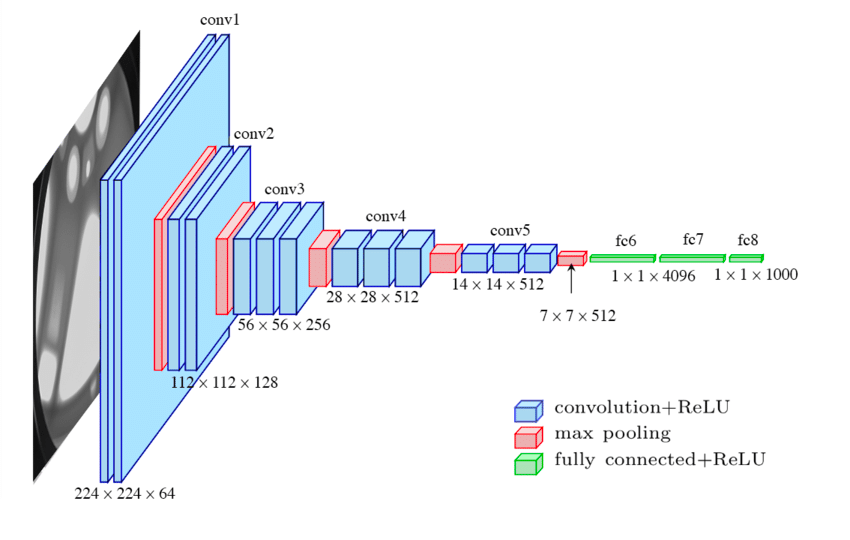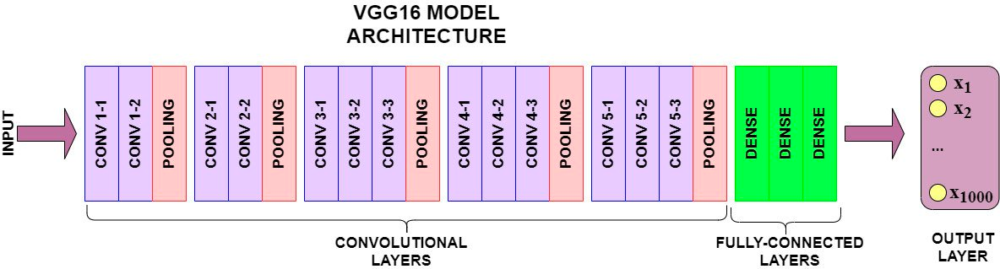

## 6.2 Practical Implications



Our results for this project show that this model is useful in many different real world situations. The accuracy values we recieved from our results were very good in identifying the six different denominations for the indian rupee. Although we only trained our model on the Indian Rupee, this model also has potential to be trained on multiple other currencys (e.g. Euros, Dollars, Pesos, etc). The various different real world situations this can be used in are retail, banking, investing, or any other industry with a large reliance on currency. An scenario where this would be helpful is for people who are blind to be able to identify the denomination of money.  43 million individuals worldwide are estimated to suffer blindness and over 200 million people suffer moderate or severe vision impairment. This can help them know the difference between, for example a 50 rupee note or a 100 rupee. Another scanario this could be useful is for banks to recognize is the currency is real or not. For example, a 50 rupee bill has distinct features, but if the note was in the colour black with a differnt font it is clear that it isnt a 50 rupee denomination. This can reduce the banks risk and overall save them money.






## 6.3 Insights from Our Machine Learning Project:



One of the most surprising thing we learned during this machine learning project is how important the dataset is to have a successful model. The model is only as good as the dataset. If you feed the model a really small or poor dataset, it has a low amount of information to learn from. This can significantly increase the risk of overfitting. Hence, we learned that a good sized dataset and the quality of the dataset is essential to have a good model.


## 6.4 Opportunities for Further Exploration



A major change that we would love to implement if we could continue on this project is training the model with different currency types. At the current moment in time, the dataset we trained the model on is the Indian currency dataset. It would be great to find a dataset that is good enough to train the model with Canadian Dollars or even US Dollars. This can extend our real world applications to multiple different nations handling different currencies. Larger datasets are also helpful in further improving the performance of our results as there are more opportunites for better recognition

## 6.4 Bibliography



[1] Kappagantula, Srilatha, and Amol Kulkarni. Future of Image Technology Solutions in Financial Services - Infosys. https://www.infosys.com/industries/financial-services/white-papers/Documents/future-image-technologies.pdf. 


[2] Digalaki, Eleni. “The Impact of Artificial Intelligence in the Banking Sector & How Ai Is Being Used in 2022.” Business Insider, Business Insider, https://www.businessinsider.com/ai-in-banking-report. 


[3] Rupert Bourne, Jaimie D Steinmetz, Seth Flaxman, Paul Svitil Briant, Hugh R Taylor, Serge Resnikoff, Robert James Casson, Amir Abdoli, Eman Abu-Gharbieh, Ashkan Afshin, et al. 2021. Trends in prevalence of blindness and distance and near vision impairment over 30 years: an analysis for the Global Burden of Disease Study. The Lancet Global Health 9, 2 (2021), e130–e143.


[4] “Ageing and Health.” World Health Organization, World Health Organization, https://www.who.int/news-room/fact-sheets/detail/ageing-and-health. 


[5] Growcoot, M. (2022, April 21). New Machine Vision algorithm vastly improves robotic object recognition. PetaPixel. Retrieved February 12, 2023, from https://petapixel.com/2022/04/21/new-machine-vision-algorithm-vastly-improves-robotic-object-recognition/ 


[6] IBM. (n.d.). What are convolutional neural networks? IBM. Retrieved February 14, 2023, from https://www.ibm.com/topics/convolutional-neural-networks 

[7] Oviedo, F., Vinnakota, S., Seleznev, E., Malhotra, H., Shaikh, S., & Ferres, J. L. (1970, January 1). Banknote-net: Open dataset for Assistive Universal Currency Recognition. – arXiv Vanity. Retrieved February 12, 2023, from https://www.arxiv-vanity.com/papers/2204.03738/ 

[8] “Convolutional Neural Network (CNN) &nbsp;: &nbsp; Tensorflow Core.” TensorFlow, https://www.tensorflow.org/tutorials/images/cnn. 

